# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

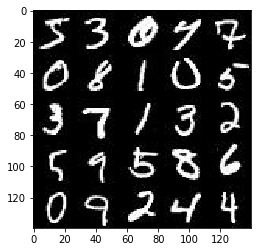

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

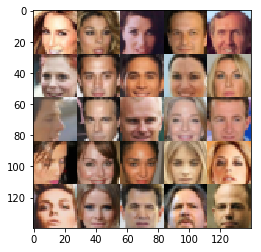

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.8.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    realInput = tf.placeholder(tf.float32,[None, image_width, image_height, image_channels], 'realInput')
    zInput = tf.placeholder(tf.float32, [None, z_dim], 'zInput')
    learningRate = tf.placeholder(tf.float32, None, 'learningRate')

    return realInput, zInput, learningRate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.01):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    leaky_relu = lambda x: tf.maximum(alpha * x, x)
    
    with tf.variable_scope("discriminator", reuse=reuse):
        x1 = tf.layers.conv2d(images,64,5,strides=2,padding='same')
        relu1 = leaky_relu(x1)
        relu1 = tf.layers.dropout(relu1, rate=0.4)
        
        x2 = tf.layers.conv2d(relu1,128,5,strides=2,padding='same')
        bn2 = tf.layers.batch_normalization(x2,training = True)
        relu2 = leaky_relu(x2)
        relu2 = tf.layers.dropout(relu2, rate=0.2)
        
        x3 = tf.layers.conv2d(relu2,256,5,strides=2,padding='same')
        bn3 = tf.layers.batch_normalization(x3,training = True)
        relu3 = leaky_relu(x3)
        relu3 = tf.layers.dropout(relu3, rate=0.1)
        
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat,1)
        out = tf.sigmoid(logits)

        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, reuse=False, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    leaky_relu = lambda x: tf.maximum(alpha * x, x)
    with tf.variable_scope("generator", reuse=not is_train):
        x1 = tf.layers.dense(z, 7*7*512)
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        bn1 = tf.layers.batch_normalization(x1, training=is_train)
        relu1 = leaky_relu(bn1)
        relu1 = tf.layers.dropout(relu1, rate=0.3)
        
        # 7*7*512
        
        x2 = tf.layers.conv2d_transpose(relu1, 256, 5, 1, 'SAME')
        bn2 = tf.layers.batch_normalization(x2, training=is_train)
        relu2 = leaky_relu(bn2)
        relu2 = tf.layers.dropout(relu2, rate=0.2)
        # 7*7*256
        
        x3 = tf.layers.conv2d_transpose(relu2, 128, 5, 2, 'SAME')
        bn3 = tf.layers.batch_normalization(x3, training=is_train)
        relu3 = leaky_relu(bn3)
        relu3 = tf.layers.dropout(relu3, rate=0.1)
        # 14*14*128
    
        logits = tf.layers.conv2d_transpose(relu3, out_channel_dim, 5, 2, 'SAME')
        out = tf.tanh(logits)
        # 28*28*out_channel_dim
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
import numpy as np

In [9]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
     # Get weights and bias to update
    d_vars = tf.trainable_variables('discriminator')
    g_vars = tf.trainable_variables('generator')

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)

    steps = 0
    print_every = 10
    show_every = batch_size

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_images = batch_images*2
                
                # Get input noise
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
            
                if steps % print_every == 0:
                    train_loss_d = d_loss.eval(feed_dict={input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval(feed_dict={input_z: batch_z})
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, batch_size, input_z, data_shape[3], data_image_mode)

                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.8458... Generator Loss: 1.5587
Epoch 1/2... Discriminator Loss: 2.5398... Generator Loss: 2.1178
Epoch 1/2... Discriminator Loss: 1.7214... Generator Loss: 0.4856
Epoch 1/2... Discriminator Loss: 0.9688... Generator Loss: 1.3668
Epoch 1/2... Discriminator Loss: 0.8795... Generator Loss: 1.1648
Epoch 1/2... Discriminator Loss: 0.9847... Generator Loss: 1.0147


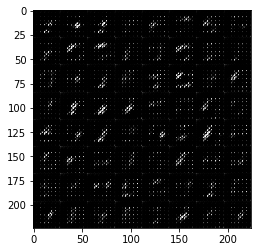

Epoch 1/2... Discriminator Loss: 1.2965... Generator Loss: 0.6835
Epoch 1/2... Discriminator Loss: 0.7219... Generator Loss: 1.2650
Epoch 1/2... Discriminator Loss: 0.6734... Generator Loss: 1.6125
Epoch 1/2... Discriminator Loss: 1.2019... Generator Loss: 0.7791
Epoch 1/2... Discriminator Loss: 0.8454... Generator Loss: 0.8970
Epoch 1/2... Discriminator Loss: 0.7682... Generator Loss: 1.2767


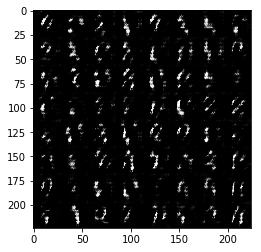

Epoch 1/2... Discriminator Loss: 0.9458... Generator Loss: 0.9681
Epoch 1/2... Discriminator Loss: 1.4979... Generator Loss: 0.8087
Epoch 1/2... Discriminator Loss: 1.2569... Generator Loss: 0.7320
Epoch 1/2... Discriminator Loss: 0.7818... Generator Loss: 1.3741
Epoch 1/2... Discriminator Loss: 1.0886... Generator Loss: 1.1245
Epoch 1/2... Discriminator Loss: 1.2365... Generator Loss: 1.1119
Epoch 1/2... Discriminator Loss: 1.4905... Generator Loss: 0.7426


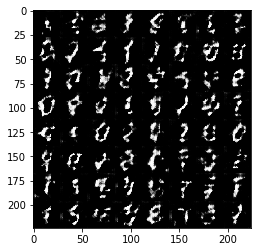

Epoch 1/2... Discriminator Loss: 0.8040... Generator Loss: 1.1388
Epoch 1/2... Discriminator Loss: 1.1076... Generator Loss: 1.3334
Epoch 1/2... Discriminator Loss: 0.8755... Generator Loss: 1.2266
Epoch 1/2... Discriminator Loss: 1.0278... Generator Loss: 1.0333
Epoch 1/2... Discriminator Loss: 1.0898... Generator Loss: 0.7975
Epoch 1/2... Discriminator Loss: 0.9343... Generator Loss: 1.2719


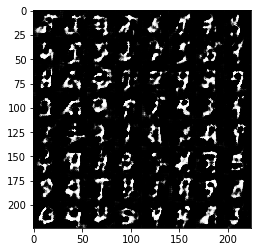

Epoch 1/2... Discriminator Loss: 1.3966... Generator Loss: 0.8527
Epoch 1/2... Discriminator Loss: 1.0012... Generator Loss: 0.9103
Epoch 1/2... Discriminator Loss: 0.9697... Generator Loss: 0.9463
Epoch 1/2... Discriminator Loss: 0.8781... Generator Loss: 0.9420
Epoch 1/2... Discriminator Loss: 1.1491... Generator Loss: 1.0284
Epoch 1/2... Discriminator Loss: 1.0988... Generator Loss: 1.2237
Epoch 1/2... Discriminator Loss: 1.1918... Generator Loss: 0.8310


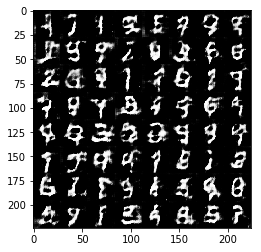

Epoch 1/2... Discriminator Loss: 0.9269... Generator Loss: 1.2435
Epoch 1/2... Discriminator Loss: 0.8269... Generator Loss: 1.1942
Epoch 1/2... Discriminator Loss: 1.3942... Generator Loss: 0.8547
Epoch 1/2... Discriminator Loss: 1.1432... Generator Loss: 0.8964
Epoch 1/2... Discriminator Loss: 1.1500... Generator Loss: 0.8542
Epoch 1/2... Discriminator Loss: 0.9669... Generator Loss: 1.0975


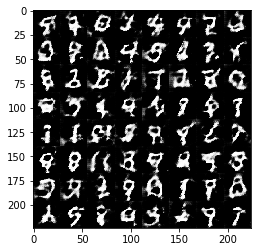

Epoch 1/2... Discriminator Loss: 1.2945... Generator Loss: 0.5925
Epoch 1/2... Discriminator Loss: 1.1959... Generator Loss: 0.6625
Epoch 1/2... Discriminator Loss: 1.1023... Generator Loss: 0.8454
Epoch 1/2... Discriminator Loss: 0.9979... Generator Loss: 1.0524
Epoch 1/2... Discriminator Loss: 1.1209... Generator Loss: 0.9974
Epoch 1/2... Discriminator Loss: 1.0302... Generator Loss: 1.1278


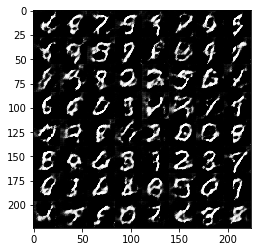

Epoch 1/2... Discriminator Loss: 0.9745... Generator Loss: 1.1572
Epoch 1/2... Discriminator Loss: 0.8504... Generator Loss: 1.4904
Epoch 1/2... Discriminator Loss: 0.9811... Generator Loss: 0.9338
Epoch 1/2... Discriminator Loss: 1.0715... Generator Loss: 0.7962
Epoch 1/2... Discriminator Loss: 1.1285... Generator Loss: 0.7677
Epoch 1/2... Discriminator Loss: 1.0820... Generator Loss: 0.7560
Epoch 1/2... Discriminator Loss: 1.1477... Generator Loss: 0.9050


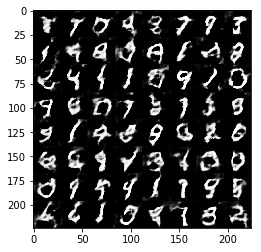

Epoch 1/2... Discriminator Loss: 1.1699... Generator Loss: 0.9067
Epoch 1/2... Discriminator Loss: 1.1680... Generator Loss: 0.9206
Epoch 1/2... Discriminator Loss: 1.1819... Generator Loss: 0.9660
Epoch 1/2... Discriminator Loss: 0.9479... Generator Loss: 1.2344
Epoch 1/2... Discriminator Loss: 1.2593... Generator Loss: 1.2746
Epoch 1/2... Discriminator Loss: 1.0993... Generator Loss: 0.7741


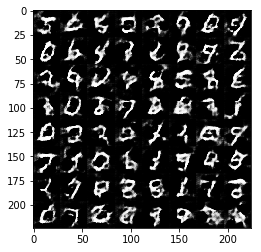

Epoch 1/2... Discriminator Loss: 1.0137... Generator Loss: 0.8653
Epoch 1/2... Discriminator Loss: 0.9815... Generator Loss: 0.9964
Epoch 1/2... Discriminator Loss: 0.9438... Generator Loss: 0.9765
Epoch 1/2... Discriminator Loss: 1.1112... Generator Loss: 0.8050
Epoch 1/2... Discriminator Loss: 1.1123... Generator Loss: 1.1038
Epoch 1/2... Discriminator Loss: 1.1227... Generator Loss: 0.7167
Epoch 1/2... Discriminator Loss: 1.0979... Generator Loss: 1.0722


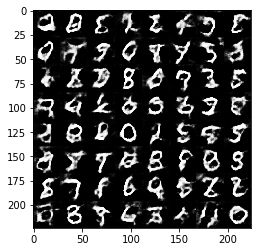

Epoch 1/2... Discriminator Loss: 1.0385... Generator Loss: 1.0345
Epoch 1/2... Discriminator Loss: 1.0760... Generator Loss: 1.0977
Epoch 1/2... Discriminator Loss: 0.9699... Generator Loss: 1.1957
Epoch 1/2... Discriminator Loss: 1.0370... Generator Loss: 0.9340
Epoch 1/2... Discriminator Loss: 1.1762... Generator Loss: 0.9432
Epoch 1/2... Discriminator Loss: 0.9582... Generator Loss: 0.9710


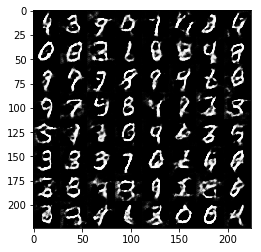

Epoch 1/2... Discriminator Loss: 1.0871... Generator Loss: 1.2445
Epoch 1/2... Discriminator Loss: 1.3136... Generator Loss: 0.7704
Epoch 1/2... Discriminator Loss: 1.1075... Generator Loss: 0.8331
Epoch 1/2... Discriminator Loss: 1.0670... Generator Loss: 0.9001
Epoch 1/2... Discriminator Loss: 1.0298... Generator Loss: 1.0292
Epoch 1/2... Discriminator Loss: 0.9900... Generator Loss: 1.0095


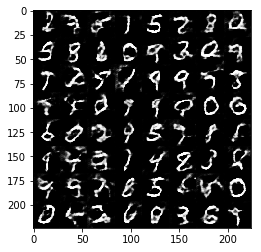

Epoch 1/2... Discriminator Loss: 1.0367... Generator Loss: 1.0946
Epoch 1/2... Discriminator Loss: 1.0935... Generator Loss: 1.0348
Epoch 1/2... Discriminator Loss: 1.1566... Generator Loss: 0.8908
Epoch 1/2... Discriminator Loss: 1.1964... Generator Loss: 0.7464
Epoch 1/2... Discriminator Loss: 1.0753... Generator Loss: 1.1141
Epoch 1/2... Discriminator Loss: 1.0936... Generator Loss: 0.8258
Epoch 1/2... Discriminator Loss: 1.1758... Generator Loss: 1.3215


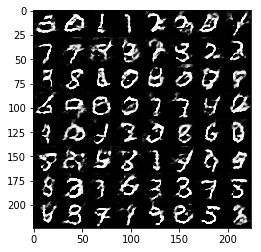

Epoch 1/2... Discriminator Loss: 0.7912... Generator Loss: 1.2959
Epoch 1/2... Discriminator Loss: 0.8978... Generator Loss: 1.4100
Epoch 1/2... Discriminator Loss: 1.1436... Generator Loss: 1.0111
Epoch 1/2... Discriminator Loss: 1.0520... Generator Loss: 0.8225
Epoch 1/2... Discriminator Loss: 1.0201... Generator Loss: 0.9062
Epoch 1/2... Discriminator Loss: 0.9766... Generator Loss: 1.0755


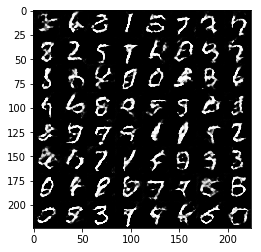

Epoch 1/2... Discriminator Loss: 0.8087... Generator Loss: 1.1757
Epoch 1/2... Discriminator Loss: 1.0158... Generator Loss: 0.9238
Epoch 1/2... Discriminator Loss: 1.0373... Generator Loss: 0.8939
Epoch 1/2... Discriminator Loss: 1.0705... Generator Loss: 0.9902
Epoch 2/2... Discriminator Loss: 0.9374... Generator Loss: 1.1772
Epoch 2/2... Discriminator Loss: 1.0181... Generator Loss: 1.1742
Epoch 2/2... Discriminator Loss: 1.0735... Generator Loss: 0.8614


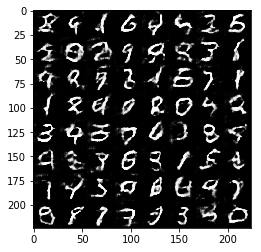

Epoch 2/2... Discriminator Loss: 0.9882... Generator Loss: 1.0541
Epoch 2/2... Discriminator Loss: 1.0251... Generator Loss: 0.8707
Epoch 2/2... Discriminator Loss: 1.0382... Generator Loss: 1.0710
Epoch 2/2... Discriminator Loss: 0.9948... Generator Loss: 1.2244
Epoch 2/2... Discriminator Loss: 1.1766... Generator Loss: 0.5880
Epoch 2/2... Discriminator Loss: 0.9526... Generator Loss: 1.2275


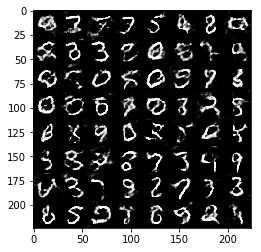

Epoch 2/2... Discriminator Loss: 0.9785... Generator Loss: 0.8861
Epoch 2/2... Discriminator Loss: 1.0369... Generator Loss: 0.8564
Epoch 2/2... Discriminator Loss: 1.0074... Generator Loss: 1.1354
Epoch 2/2... Discriminator Loss: 1.1861... Generator Loss: 0.9395
Epoch 2/2... Discriminator Loss: 1.1903... Generator Loss: 0.9802
Epoch 2/2... Discriminator Loss: 1.0897... Generator Loss: 0.8169


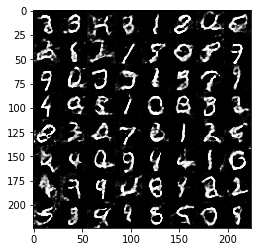

Epoch 2/2... Discriminator Loss: 1.1072... Generator Loss: 1.1023
Epoch 2/2... Discriminator Loss: 1.1113... Generator Loss: 0.8171
Epoch 2/2... Discriminator Loss: 0.8851... Generator Loss: 1.2116
Epoch 2/2... Discriminator Loss: 0.9157... Generator Loss: 0.9978
Epoch 2/2... Discriminator Loss: 0.9656... Generator Loss: 0.9841
Epoch 2/2... Discriminator Loss: 0.8668... Generator Loss: 1.1359
Epoch 2/2... Discriminator Loss: 1.0235... Generator Loss: 0.9242


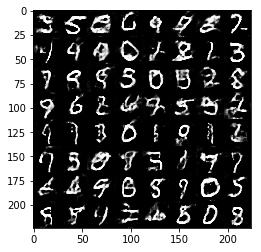

Epoch 2/2... Discriminator Loss: 1.0682... Generator Loss: 1.0671
Epoch 2/2... Discriminator Loss: 0.9802... Generator Loss: 1.0191
Epoch 2/2... Discriminator Loss: 1.1644... Generator Loss: 0.6256
Epoch 2/2... Discriminator Loss: 0.9495... Generator Loss: 1.1005
Epoch 2/2... Discriminator Loss: 0.9970... Generator Loss: 0.9789
Epoch 2/2... Discriminator Loss: 0.9740... Generator Loss: 1.1781


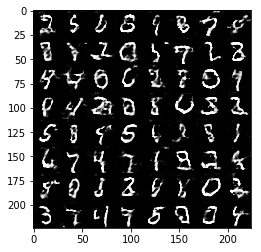

Epoch 2/2... Discriminator Loss: 0.9369... Generator Loss: 1.0706
Epoch 2/2... Discriminator Loss: 1.0261... Generator Loss: 1.0980
Epoch 2/2... Discriminator Loss: 1.0143... Generator Loss: 0.8584
Epoch 2/2... Discriminator Loss: 0.9285... Generator Loss: 1.0638
Epoch 2/2... Discriminator Loss: 1.0246... Generator Loss: 1.1854
Epoch 2/2... Discriminator Loss: 1.0442... Generator Loss: 1.0404
Epoch 2/2... Discriminator Loss: 1.1730... Generator Loss: 0.6914


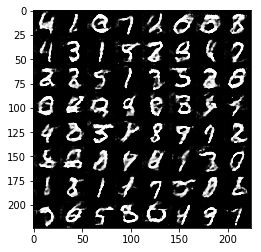

Epoch 2/2... Discriminator Loss: 0.9540... Generator Loss: 1.2651
Epoch 2/2... Discriminator Loss: 1.2213... Generator Loss: 1.5082
Epoch 2/2... Discriminator Loss: 1.0466... Generator Loss: 0.9931
Epoch 2/2... Discriminator Loss: 1.2406... Generator Loss: 0.6578
Epoch 2/2... Discriminator Loss: 0.9995... Generator Loss: 1.0669
Epoch 2/2... Discriminator Loss: 1.2831... Generator Loss: 0.8506


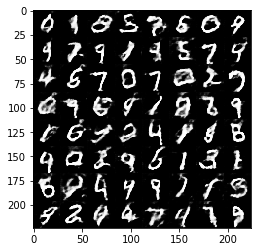

Epoch 2/2... Discriminator Loss: 1.3002... Generator Loss: 0.5772
Epoch 2/2... Discriminator Loss: 0.9727... Generator Loss: 0.9188
Epoch 2/2... Discriminator Loss: 1.0034... Generator Loss: 1.1970
Epoch 2/2... Discriminator Loss: 1.0924... Generator Loss: 0.9595
Epoch 2/2... Discriminator Loss: 0.8820... Generator Loss: 1.0878
Epoch 2/2... Discriminator Loss: 0.9242... Generator Loss: 1.0072


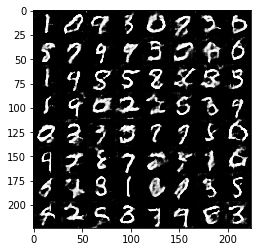

Epoch 2/2... Discriminator Loss: 0.9104... Generator Loss: 1.3325
Epoch 2/2... Discriminator Loss: 1.0781... Generator Loss: 0.9397
Epoch 2/2... Discriminator Loss: 1.1002... Generator Loss: 1.1261
Epoch 2/2... Discriminator Loss: 0.9541... Generator Loss: 0.9667
Epoch 2/2... Discriminator Loss: 1.0142... Generator Loss: 1.2400
Epoch 2/2... Discriminator Loss: 1.0894... Generator Loss: 1.0235
Epoch 2/2... Discriminator Loss: 1.1277... Generator Loss: 0.7999


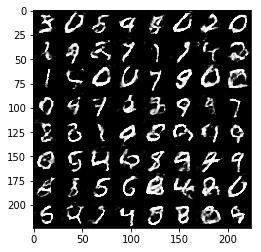

Epoch 2/2... Discriminator Loss: 0.9889... Generator Loss: 0.8933
Epoch 2/2... Discriminator Loss: 1.0045... Generator Loss: 1.0437
Epoch 2/2... Discriminator Loss: 1.0233... Generator Loss: 1.0746
Epoch 2/2... Discriminator Loss: 1.0765... Generator Loss: 0.7527
Epoch 2/2... Discriminator Loss: 0.9752... Generator Loss: 1.0950
Epoch 2/2... Discriminator Loss: 0.9235... Generator Loss: 1.4476


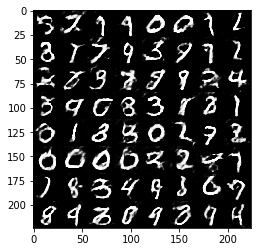

Epoch 2/2... Discriminator Loss: 0.8875... Generator Loss: 1.2562
Epoch 2/2... Discriminator Loss: 1.0232... Generator Loss: 0.8486
Epoch 2/2... Discriminator Loss: 1.0875... Generator Loss: 1.0802
Epoch 2/2... Discriminator Loss: 0.9933... Generator Loss: 1.0084
Epoch 2/2... Discriminator Loss: 0.9479... Generator Loss: 1.0547
Epoch 2/2... Discriminator Loss: 0.9830... Generator Loss: 0.8931
Epoch 2/2... Discriminator Loss: 0.9715... Generator Loss: 0.9364


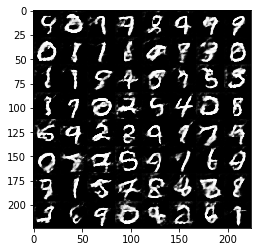

Epoch 2/2... Discriminator Loss: 1.3083... Generator Loss: 0.5844
Epoch 2/2... Discriminator Loss: 0.9924... Generator Loss: 1.4637
Epoch 2/2... Discriminator Loss: 0.9897... Generator Loss: 0.9387
Epoch 2/2... Discriminator Loss: 1.0587... Generator Loss: 1.0246
Epoch 2/2... Discriminator Loss: 1.0671... Generator Loss: 0.9418
Epoch 2/2... Discriminator Loss: 0.8860... Generator Loss: 1.0487


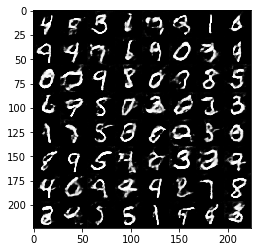

Epoch 2/2... Discriminator Loss: 1.0538... Generator Loss: 0.8669
Epoch 2/2... Discriminator Loss: 0.9947... Generator Loss: 1.1145
Epoch 2/2... Discriminator Loss: 0.9765... Generator Loss: 0.8994
Epoch 2/2... Discriminator Loss: 0.9769... Generator Loss: 1.0866
Epoch 2/2... Discriminator Loss: 1.0587... Generator Loss: 0.7427
Epoch 2/2... Discriminator Loss: 1.0971... Generator Loss: 0.6984


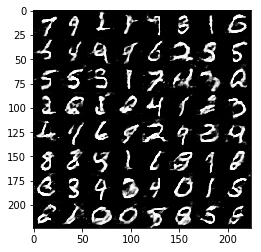

Epoch 2/2... Discriminator Loss: 1.2811... Generator Loss: 0.6277
Epoch 2/2... Discriminator Loss: 1.1624... Generator Loss: 0.8404
Epoch 2/2... Discriminator Loss: 0.9536... Generator Loss: 0.9995
Epoch 2/2... Discriminator Loss: 0.9649... Generator Loss: 1.0483
Epoch 2/2... Discriminator Loss: 1.0284... Generator Loss: 0.9766
Epoch 2/2... Discriminator Loss: 0.8581... Generator Loss: 1.2150
Epoch 2/2... Discriminator Loss: 1.1206... Generator Loss: 0.9417


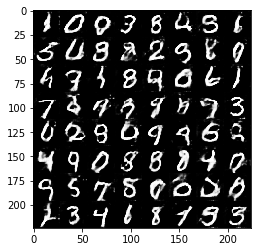

Epoch 2/2... Discriminator Loss: 4.1014... Generator Loss: 5.6134
Epoch 2/2... Discriminator Loss: 2.9410... Generator Loss: 0.0850
Epoch 2/2... Discriminator Loss: 1.0233... Generator Loss: 0.8813
Epoch 2/2... Discriminator Loss: 1.1991... Generator Loss: 0.8009
Epoch 2/2... Discriminator Loss: 1.0952... Generator Loss: 1.0180
Epoch 2/2... Discriminator Loss: 1.1661... Generator Loss: 0.8636


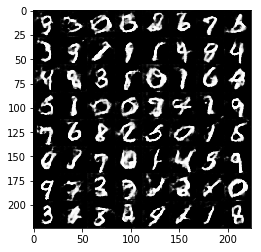

Epoch 2/2... Discriminator Loss: 1.1295... Generator Loss: 0.8809
Epoch 2/2... Discriminator Loss: 0.9160... Generator Loss: 1.1859


In [13]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.6137... Generator Loss: 1.8100
Epoch 1/1... Discriminator Loss: 0.8484... Generator Loss: 1.3343
Epoch 1/1... Discriminator Loss: 1.0243... Generator Loss: 1.0391
Epoch 1/1... Discriminator Loss: 1.5325... Generator Loss: 1.9757
Epoch 1/1... Discriminator Loss: 1.2991... Generator Loss: 0.9043
Epoch 1/1... Discriminator Loss: 1.1767... Generator Loss: 1.3630


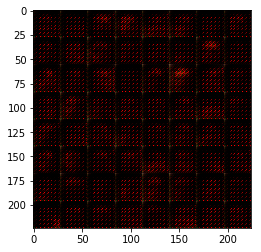

Epoch 1/1... Discriminator Loss: 1.1393... Generator Loss: 0.8807
Epoch 1/1... Discriminator Loss: 1.0800... Generator Loss: 1.0605
Epoch 1/1... Discriminator Loss: 1.5671... Generator Loss: 0.6949
Epoch 1/1... Discriminator Loss: 1.0747... Generator Loss: 0.8146
Epoch 1/1... Discriminator Loss: 1.8079... Generator Loss: 0.8099
Epoch 1/1... Discriminator Loss: 1.1876... Generator Loss: 0.8173


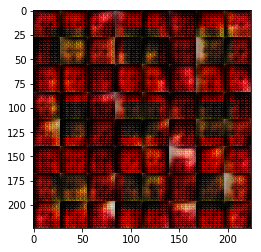

Epoch 1/1... Discriminator Loss: 1.0214... Generator Loss: 1.0457
Epoch 1/1... Discriminator Loss: 1.2685... Generator Loss: 1.0123
Epoch 1/1... Discriminator Loss: 1.0813... Generator Loss: 0.8750
Epoch 1/1... Discriminator Loss: 1.1446... Generator Loss: 0.7535
Epoch 1/1... Discriminator Loss: 1.1631... Generator Loss: 0.9125
Epoch 1/1... Discriminator Loss: 1.3403... Generator Loss: 0.7587
Epoch 1/1... Discriminator Loss: 1.3230... Generator Loss: 0.6815


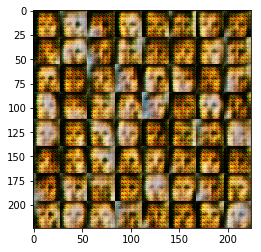

Epoch 1/1... Discriminator Loss: 1.8276... Generator Loss: 0.5453
Epoch 1/1... Discriminator Loss: 1.4172... Generator Loss: 0.6992
Epoch 1/1... Discriminator Loss: 1.4798... Generator Loss: 1.1390
Epoch 1/1... Discriminator Loss: 1.3311... Generator Loss: 1.3914
Epoch 1/1... Discriminator Loss: 1.2543... Generator Loss: 0.7465
Epoch 1/1... Discriminator Loss: 1.0890... Generator Loss: 1.0490


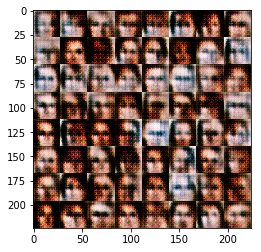

Epoch 1/1... Discriminator Loss: 1.2441... Generator Loss: 0.7066
Epoch 1/1... Discriminator Loss: 1.0886... Generator Loss: 0.9416
Epoch 1/1... Discriminator Loss: 1.2681... Generator Loss: 0.8312
Epoch 1/1... Discriminator Loss: 1.1362... Generator Loss: 0.9274
Epoch 1/1... Discriminator Loss: 1.2649... Generator Loss: 1.2156
Epoch 1/1... Discriminator Loss: 1.2935... Generator Loss: 0.6843
Epoch 1/1... Discriminator Loss: 1.2942... Generator Loss: 0.7612


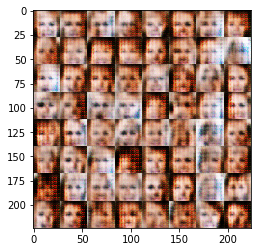

Epoch 1/1... Discriminator Loss: 1.3122... Generator Loss: 1.1121
Epoch 1/1... Discriminator Loss: 1.0745... Generator Loss: 0.8366
Epoch 1/1... Discriminator Loss: 1.0442... Generator Loss: 0.8898
Epoch 1/1... Discriminator Loss: 1.3037... Generator Loss: 0.7159
Epoch 1/1... Discriminator Loss: 1.3243... Generator Loss: 0.6771
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.9814


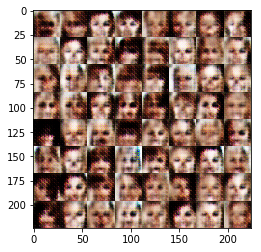

Epoch 1/1... Discriminator Loss: 1.1008... Generator Loss: 0.9763
Epoch 1/1... Discriminator Loss: 1.0794... Generator Loss: 1.0068
Epoch 1/1... Discriminator Loss: 1.0238... Generator Loss: 0.8748
Epoch 1/1... Discriminator Loss: 1.3255... Generator Loss: 0.7815
Epoch 1/1... Discriminator Loss: 1.3189... Generator Loss: 0.7277
Epoch 1/1... Discriminator Loss: 1.7240... Generator Loss: 0.3703


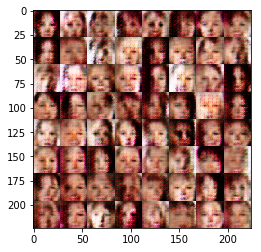

Epoch 1/1... Discriminator Loss: 1.3228... Generator Loss: 1.0620
Epoch 1/1... Discriminator Loss: 1.2265... Generator Loss: 0.6416
Epoch 1/1... Discriminator Loss: 1.2162... Generator Loss: 0.5938
Epoch 1/1... Discriminator Loss: 1.3718... Generator Loss: 1.4686
Epoch 1/1... Discriminator Loss: 1.3429... Generator Loss: 0.7636
Epoch 1/1... Discriminator Loss: 1.0674... Generator Loss: 0.8570
Epoch 1/1... Discriminator Loss: 1.0638... Generator Loss: 0.9351


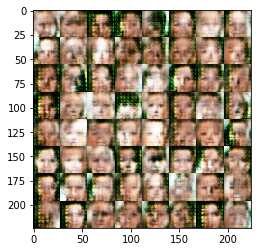

Epoch 1/1... Discriminator Loss: 1.2494... Generator Loss: 0.6591
Epoch 1/1... Discriminator Loss: 1.6473... Generator Loss: 1.5239
Epoch 1/1... Discriminator Loss: 1.2848... Generator Loss: 0.5851
Epoch 1/1... Discriminator Loss: 1.1372... Generator Loss: 0.8614
Epoch 1/1... Discriminator Loss: 1.1382... Generator Loss: 1.0399
Epoch 1/1... Discriminator Loss: 1.0948... Generator Loss: 0.6959


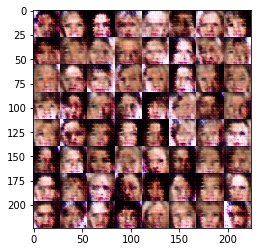

Epoch 1/1... Discriminator Loss: 1.2261... Generator Loss: 0.5953
Epoch 1/1... Discriminator Loss: 1.3090... Generator Loss: 0.5651
Epoch 1/1... Discriminator Loss: 1.1648... Generator Loss: 0.8023
Epoch 1/1... Discriminator Loss: 1.2131... Generator Loss: 1.0230
Epoch 1/1... Discriminator Loss: 1.2648... Generator Loss: 0.8791
Epoch 1/1... Discriminator Loss: 1.1284... Generator Loss: 0.7332
Epoch 1/1... Discriminator Loss: 1.2809... Generator Loss: 1.2080


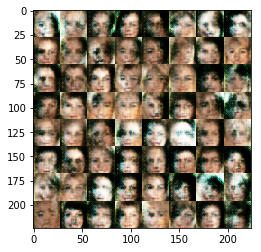

Epoch 1/1... Discriminator Loss: 1.3006... Generator Loss: 0.6876
Epoch 1/1... Discriminator Loss: 1.1333... Generator Loss: 1.0343
Epoch 1/1... Discriminator Loss: 1.2647... Generator Loss: 0.8989
Epoch 1/1... Discriminator Loss: 2.0289... Generator Loss: 1.9757
Epoch 1/1... Discriminator Loss: 1.4094... Generator Loss: 0.8194
Epoch 1/1... Discriminator Loss: 1.1880... Generator Loss: 0.8396


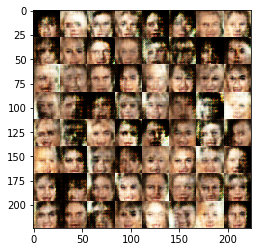

Epoch 1/1... Discriminator Loss: 1.2102... Generator Loss: 1.0875
Epoch 1/1... Discriminator Loss: 1.2661... Generator Loss: 0.6505
Epoch 1/1... Discriminator Loss: 1.3677... Generator Loss: 0.8783
Epoch 1/1... Discriminator Loss: 1.2884... Generator Loss: 0.8410
Epoch 1/1... Discriminator Loss: 1.1346... Generator Loss: 0.7752
Epoch 1/1... Discriminator Loss: 1.1769... Generator Loss: 0.9421


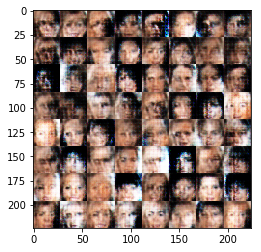

Epoch 1/1... Discriminator Loss: 1.2834... Generator Loss: 0.8043
Epoch 1/1... Discriminator Loss: 1.3415... Generator Loss: 0.7484
Epoch 1/1... Discriminator Loss: 1.2004... Generator Loss: 0.5671
Epoch 1/1... Discriminator Loss: 1.2013... Generator Loss: 0.6575
Epoch 1/1... Discriminator Loss: 1.5097... Generator Loss: 0.4687
Epoch 1/1... Discriminator Loss: 1.2080... Generator Loss: 0.6750
Epoch 1/1... Discriminator Loss: 1.2624... Generator Loss: 0.6448


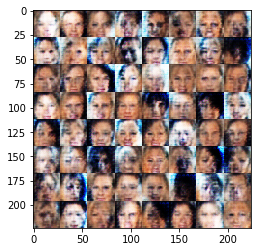

Epoch 1/1... Discriminator Loss: 1.2302... Generator Loss: 0.7412
Epoch 1/1... Discriminator Loss: 1.1062... Generator Loss: 0.9526
Epoch 1/1... Discriminator Loss: 1.2048... Generator Loss: 0.7781
Epoch 1/1... Discriminator Loss: 1.2689... Generator Loss: 1.3155
Epoch 1/1... Discriminator Loss: 1.3120... Generator Loss: 0.5593
Epoch 1/1... Discriminator Loss: 1.2424... Generator Loss: 0.8276


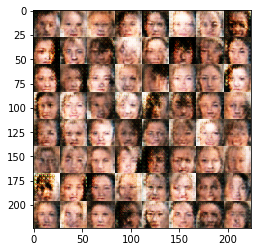

Epoch 1/1... Discriminator Loss: 1.4255... Generator Loss: 0.6043
Epoch 1/1... Discriminator Loss: 1.1060... Generator Loss: 0.8471
Epoch 1/1... Discriminator Loss: 1.1476... Generator Loss: 0.7459
Epoch 1/1... Discriminator Loss: 1.3567... Generator Loss: 0.7380
Epoch 1/1... Discriminator Loss: 1.3679... Generator Loss: 1.2309
Epoch 1/1... Discriminator Loss: 1.2916... Generator Loss: 0.7468
Epoch 1/1... Discriminator Loss: 1.1332... Generator Loss: 0.8716


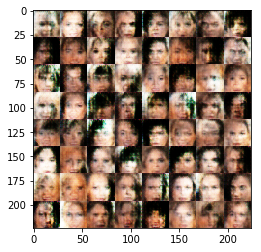

Epoch 1/1... Discriminator Loss: 1.3374... Generator Loss: 1.0057
Epoch 1/1... Discriminator Loss: 1.1661... Generator Loss: 0.7891
Epoch 1/1... Discriminator Loss: 1.3998... Generator Loss: 0.8313
Epoch 1/1... Discriminator Loss: 1.2854... Generator Loss: 0.7594
Epoch 1/1... Discriminator Loss: 1.3353... Generator Loss: 0.6424
Epoch 1/1... Discriminator Loss: 1.0660... Generator Loss: 0.8916


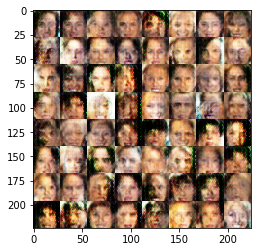

Epoch 1/1... Discriminator Loss: 1.1770... Generator Loss: 0.8170
Epoch 1/1... Discriminator Loss: 1.1230... Generator Loss: 0.8060
Epoch 1/1... Discriminator Loss: 1.1570... Generator Loss: 0.9841
Epoch 1/1... Discriminator Loss: 1.0891... Generator Loss: 0.8009
Epoch 1/1... Discriminator Loss: 1.2700... Generator Loss: 0.8543
Epoch 1/1... Discriminator Loss: 1.1921... Generator Loss: 0.7624


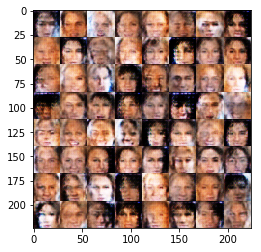

Epoch 1/1... Discriminator Loss: 1.3566... Generator Loss: 1.0826
Epoch 1/1... Discriminator Loss: 1.3647... Generator Loss: 0.6650
Epoch 1/1... Discriminator Loss: 1.2206... Generator Loss: 1.0249
Epoch 1/1... Discriminator Loss: 1.1569... Generator Loss: 0.9239
Epoch 1/1... Discriminator Loss: 1.4926... Generator Loss: 0.6295
Epoch 1/1... Discriminator Loss: 1.2319... Generator Loss: 0.7407
Epoch 1/1... Discriminator Loss: 1.2373... Generator Loss: 0.7480


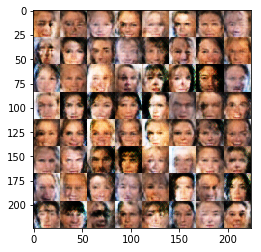

Epoch 1/1... Discriminator Loss: 1.3825... Generator Loss: 0.9154
Epoch 1/1... Discriminator Loss: 1.3027... Generator Loss: 0.7820
Epoch 1/1... Discriminator Loss: 1.2155... Generator Loss: 0.8687
Epoch 1/1... Discriminator Loss: 1.4168... Generator Loss: 0.5731
Epoch 1/1... Discriminator Loss: 1.1720... Generator Loss: 0.8292
Epoch 1/1... Discriminator Loss: 1.1871... Generator Loss: 0.7490


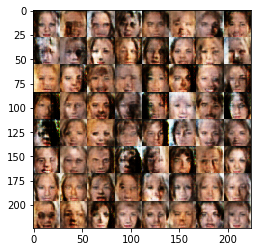

Epoch 1/1... Discriminator Loss: 1.1666... Generator Loss: 0.8888
Epoch 1/1... Discriminator Loss: 1.1863... Generator Loss: 0.8443
Epoch 1/1... Discriminator Loss: 1.0184... Generator Loss: 0.8139
Epoch 1/1... Discriminator Loss: 1.2972... Generator Loss: 0.8620
Epoch 1/1... Discriminator Loss: 1.3840... Generator Loss: 0.6670
Epoch 1/1... Discriminator Loss: 1.4122... Generator Loss: 0.5970
Epoch 1/1... Discriminator Loss: 1.5220... Generator Loss: 0.4371


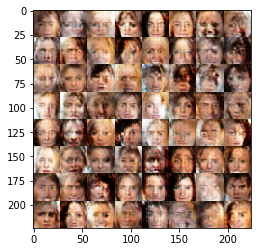

Epoch 1/1... Discriminator Loss: 1.2387... Generator Loss: 0.7472
Epoch 1/1... Discriminator Loss: 1.2713... Generator Loss: 0.7404
Epoch 1/1... Discriminator Loss: 1.1774... Generator Loss: 0.7275
Epoch 1/1... Discriminator Loss: 1.1974... Generator Loss: 0.8169
Epoch 1/1... Discriminator Loss: 1.1623... Generator Loss: 0.8272
Epoch 1/1... Discriminator Loss: 1.2104... Generator Loss: 0.7031


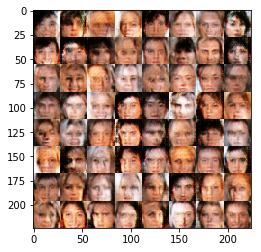

Epoch 1/1... Discriminator Loss: 1.1062... Generator Loss: 0.7497
Epoch 1/1... Discriminator Loss: 1.4321... Generator Loss: 0.6195
Epoch 1/1... Discriminator Loss: 1.3182... Generator Loss: 0.6503
Epoch 1/1... Discriminator Loss: 1.2876... Generator Loss: 0.7237
Epoch 1/1... Discriminator Loss: 1.1697... Generator Loss: 0.7933
Epoch 1/1... Discriminator Loss: 1.0530... Generator Loss: 0.9815


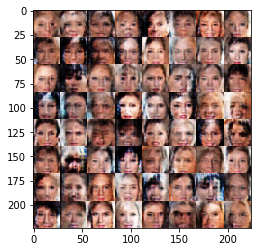

Epoch 1/1... Discriminator Loss: 1.3559... Generator Loss: 0.6858
Epoch 1/1... Discriminator Loss: 1.1648... Generator Loss: 0.7076
Epoch 1/1... Discriminator Loss: 1.3345... Generator Loss: 0.5755
Epoch 1/1... Discriminator Loss: 1.1686... Generator Loss: 0.8196
Epoch 1/1... Discriminator Loss: 1.1067... Generator Loss: 0.9454
Epoch 1/1... Discriminator Loss: 1.1232... Generator Loss: 0.8209
Epoch 1/1... Discriminator Loss: 1.9506... Generator Loss: 0.2938


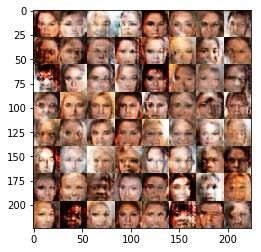

Epoch 1/1... Discriminator Loss: 1.3622... Generator Loss: 0.7153
Epoch 1/1... Discriminator Loss: 1.1739... Generator Loss: 0.8113
Epoch 1/1... Discriminator Loss: 1.2909... Generator Loss: 0.5845
Epoch 1/1... Discriminator Loss: 1.2256... Generator Loss: 0.7296
Epoch 1/1... Discriminator Loss: 1.2115... Generator Loss: 0.7913
Epoch 1/1... Discriminator Loss: 1.3188... Generator Loss: 0.5030


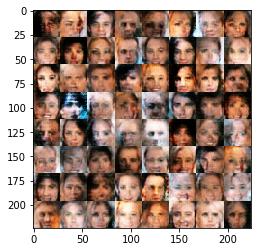

Epoch 1/1... Discriminator Loss: 1.3597... Generator Loss: 0.6431
Epoch 1/1... Discriminator Loss: 1.1576... Generator Loss: 0.9146
Epoch 1/1... Discriminator Loss: 1.2531... Generator Loss: 0.9220
Epoch 1/1... Discriminator Loss: 1.1583... Generator Loss: 0.7849
Epoch 1/1... Discriminator Loss: 1.2743... Generator Loss: 0.6182
Epoch 1/1... Discriminator Loss: 1.2575... Generator Loss: 0.6812
Epoch 1/1... Discriminator Loss: 1.4234... Generator Loss: 0.8686


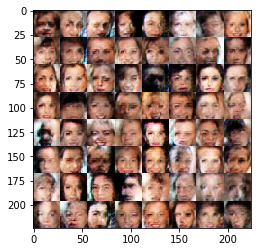

Epoch 1/1... Discriminator Loss: 1.2837... Generator Loss: 0.7342
Epoch 1/1... Discriminator Loss: 1.3668... Generator Loss: 1.0540
Epoch 1/1... Discriminator Loss: 1.1263... Generator Loss: 0.9702
Epoch 1/1... Discriminator Loss: 1.3580... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.2453... Generator Loss: 0.6980
Epoch 1/1... Discriminator Loss: 1.1956... Generator Loss: 0.9908


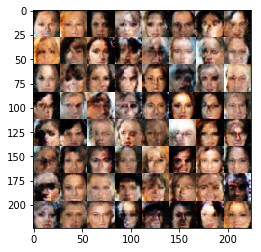

Epoch 1/1... Discriminator Loss: 1.2020... Generator Loss: 1.0453
Epoch 1/1... Discriminator Loss: 1.3355... Generator Loss: 0.6942
Epoch 1/1... Discriminator Loss: 1.2826... Generator Loss: 0.7073
Epoch 1/1... Discriminator Loss: 1.3015... Generator Loss: 0.8651
Epoch 1/1... Discriminator Loss: 1.1863... Generator Loss: 1.1266
Epoch 1/1... Discriminator Loss: 1.1790... Generator Loss: 0.9882


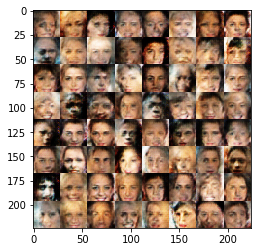

Epoch 1/1... Discriminator Loss: 1.1980... Generator Loss: 1.1715
Epoch 1/1... Discriminator Loss: 1.4426... Generator Loss: 0.5293
Epoch 1/1... Discriminator Loss: 1.3275... Generator Loss: 0.5975
Epoch 1/1... Discriminator Loss: 1.2763... Generator Loss: 0.6284
Epoch 1/1... Discriminator Loss: 1.2971... Generator Loss: 0.7408
Epoch 1/1... Discriminator Loss: 1.2887... Generator Loss: 0.8922
Epoch 1/1... Discriminator Loss: 1.2679... Generator Loss: 0.6831


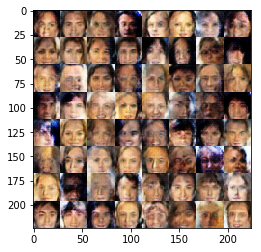

Epoch 1/1... Discriminator Loss: 1.7150... Generator Loss: 1.7817
Epoch 1/1... Discriminator Loss: 1.2791... Generator Loss: 0.8356
Epoch 1/1... Discriminator Loss: 1.2378... Generator Loss: 1.0957
Epoch 1/1... Discriminator Loss: 1.2464... Generator Loss: 0.7208
Epoch 1/1... Discriminator Loss: 1.1448... Generator Loss: 0.7163
Epoch 1/1... Discriminator Loss: 1.3062... Generator Loss: 0.7996


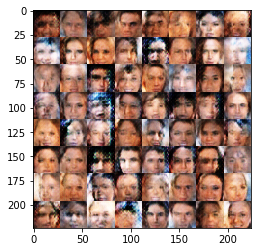

Epoch 1/1... Discriminator Loss: 1.3026... Generator Loss: 0.6295
Epoch 1/1... Discriminator Loss: 1.4195... Generator Loss: 0.7566
Epoch 1/1... Discriminator Loss: 1.0965... Generator Loss: 0.7512
Epoch 1/1... Discriminator Loss: 1.1823... Generator Loss: 0.7127
Epoch 1/1... Discriminator Loss: 1.2671... Generator Loss: 0.7715
Epoch 1/1... Discriminator Loss: 1.2840... Generator Loss: 1.0616
Epoch 1/1... Discriminator Loss: 1.2705... Generator Loss: 0.7842


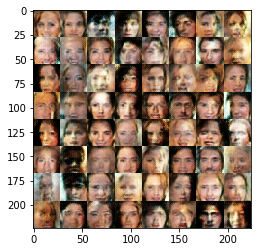

Epoch 1/1... Discriminator Loss: 1.5137... Generator Loss: 0.4773
Epoch 1/1... Discriminator Loss: 1.1432... Generator Loss: 0.7256
Epoch 1/1... Discriminator Loss: 1.1308... Generator Loss: 1.0411
Epoch 1/1... Discriminator Loss: 1.1434... Generator Loss: 0.7960
Epoch 1/1... Discriminator Loss: 1.1661... Generator Loss: 0.7584
Epoch 1/1... Discriminator Loss: 1.3151... Generator Loss: 0.5899


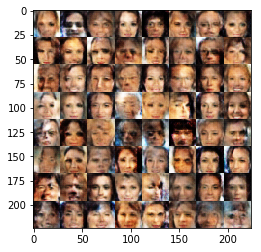

Epoch 1/1... Discriminator Loss: 1.5595... Generator Loss: 0.5032
Epoch 1/1... Discriminator Loss: 1.2709... Generator Loss: 1.0658
Epoch 1/1... Discriminator Loss: 1.1397... Generator Loss: 0.7275
Epoch 1/1... Discriminator Loss: 1.1276... Generator Loss: 0.8578
Epoch 1/1... Discriminator Loss: 2.0604... Generator Loss: 0.2518
Epoch 1/1... Discriminator Loss: 1.1749... Generator Loss: 0.8355


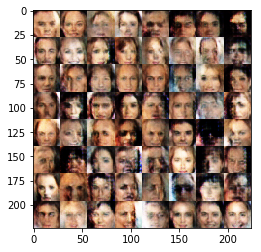

Epoch 1/1... Discriminator Loss: 1.2206... Generator Loss: 0.8117
Epoch 1/1... Discriminator Loss: 1.3193... Generator Loss: 0.6764
Epoch 1/1... Discriminator Loss: 1.1773... Generator Loss: 0.8570
Epoch 1/1... Discriminator Loss: 1.1413... Generator Loss: 0.8011
Epoch 1/1... Discriminator Loss: 1.1948... Generator Loss: 0.7006
Epoch 1/1... Discriminator Loss: 1.2753... Generator Loss: 0.6808
Epoch 1/1... Discriminator Loss: 1.2654... Generator Loss: 0.6085


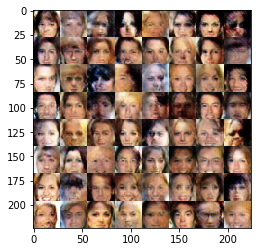

Epoch 1/1... Discriminator Loss: 1.3508... Generator Loss: 0.7609
Epoch 1/1... Discriminator Loss: 1.1834... Generator Loss: 0.6320
Epoch 1/1... Discriminator Loss: 1.2037... Generator Loss: 1.0430
Epoch 1/1... Discriminator Loss: 1.3257... Generator Loss: 0.7215
Epoch 1/1... Discriminator Loss: 1.1896... Generator Loss: 0.9129
Epoch 1/1... Discriminator Loss: 1.3212... Generator Loss: 0.6235


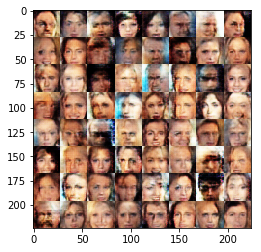

Epoch 1/1... Discriminator Loss: 1.2480... Generator Loss: 0.8629
Epoch 1/1... Discriminator Loss: 1.2038... Generator Loss: 0.7466
Epoch 1/1... Discriminator Loss: 1.3807... Generator Loss: 1.3795
Epoch 1/1... Discriminator Loss: 1.3926... Generator Loss: 0.6939
Epoch 1/1... Discriminator Loss: 1.3414... Generator Loss: 1.0997
Epoch 1/1... Discriminator Loss: 1.4473... Generator Loss: 0.6157
Epoch 1/1... Discriminator Loss: 1.3332... Generator Loss: 0.7575


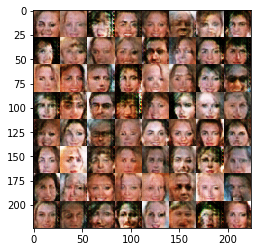

Epoch 1/1... Discriminator Loss: 1.2415... Generator Loss: 0.6577
Epoch 1/1... Discriminator Loss: 1.1561... Generator Loss: 0.6881
Epoch 1/1... Discriminator Loss: 1.2327... Generator Loss: 0.5761
Epoch 1/1... Discriminator Loss: 1.3785... Generator Loss: 1.2315
Epoch 1/1... Discriminator Loss: 1.2509... Generator Loss: 0.9242
Epoch 1/1... Discriminator Loss: 1.3194... Generator Loss: 0.7480


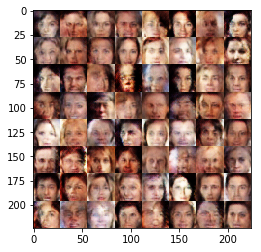

Epoch 1/1... Discriminator Loss: 1.1590... Generator Loss: 0.9131
Epoch 1/1... Discriminator Loss: 1.2994... Generator Loss: 1.1282
Epoch 1/1... Discriminator Loss: 1.2002... Generator Loss: 0.7402
Epoch 1/1... Discriminator Loss: 1.3823... Generator Loss: 0.6398
Epoch 1/1... Discriminator Loss: 1.2514... Generator Loss: 0.9234
Epoch 1/1... Discriminator Loss: 1.1783... Generator Loss: 0.9603


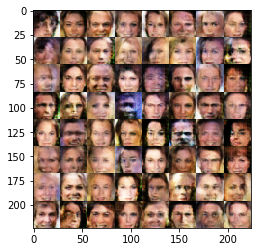

Epoch 1/1... Discriminator Loss: 1.2471... Generator Loss: 0.8338
Epoch 1/1... Discriminator Loss: 1.1682... Generator Loss: 0.8743
Epoch 1/1... Discriminator Loss: 1.1984... Generator Loss: 0.7855
Epoch 1/1... Discriminator Loss: 1.4210... Generator Loss: 0.5310
Epoch 1/1... Discriminator Loss: 1.1169... Generator Loss: 0.9270
Epoch 1/1... Discriminator Loss: 1.5562... Generator Loss: 1.4258
Epoch 1/1... Discriminator Loss: 1.1309... Generator Loss: 0.9078


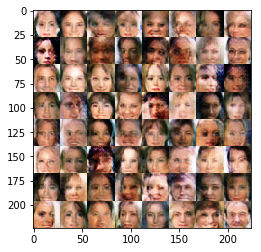

Epoch 1/1... Discriminator Loss: 1.2035... Generator Loss: 0.7739
Epoch 1/1... Discriminator Loss: 1.1666... Generator Loss: 0.8508
Epoch 1/1... Discriminator Loss: 1.3978... Generator Loss: 0.5706
Epoch 1/1... Discriminator Loss: 1.2554... Generator Loss: 0.6476
Epoch 1/1... Discriminator Loss: 1.3729... Generator Loss: 0.9933
Epoch 1/1... Discriminator Loss: 1.2154... Generator Loss: 0.9342


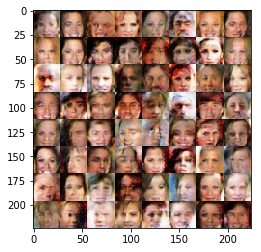

Epoch 1/1... Discriminator Loss: 1.1829... Generator Loss: 0.9043
Epoch 1/1... Discriminator Loss: 1.4083... Generator Loss: 1.4107
Epoch 1/1... Discriminator Loss: 1.2451... Generator Loss: 0.6899
Epoch 1/1... Discriminator Loss: 1.1925... Generator Loss: 0.8683
Epoch 1/1... Discriminator Loss: 1.1340... Generator Loss: 0.8529
Epoch 1/1... Discriminator Loss: 1.2899... Generator Loss: 0.7369
Epoch 1/1... Discriminator Loss: 1.2803... Generator Loss: 0.7218


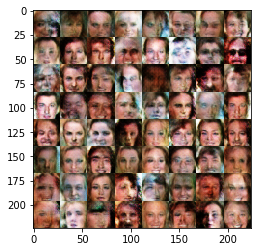

Epoch 1/1... Discriminator Loss: 1.4121... Generator Loss: 0.5513
Epoch 1/1... Discriminator Loss: 1.4058... Generator Loss: 0.5609
Epoch 1/1... Discriminator Loss: 1.2012... Generator Loss: 0.9763
Epoch 1/1... Discriminator Loss: 1.1623... Generator Loss: 0.7852
Epoch 1/1... Discriminator Loss: 1.1332... Generator Loss: 0.8180
Epoch 1/1... Discriminator Loss: 1.1111... Generator Loss: 0.8670


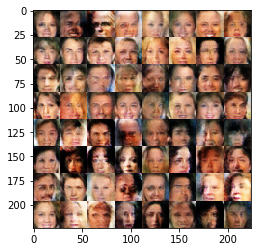

Epoch 1/1... Discriminator Loss: 1.0972... Generator Loss: 0.9836
Epoch 1/1... Discriminator Loss: 1.3091... Generator Loss: 0.7205
Epoch 1/1... Discriminator Loss: 1.1572... Generator Loss: 0.7334
Epoch 1/1... Discriminator Loss: 1.2462... Generator Loss: 0.7481
Epoch 1/1... Discriminator Loss: 1.2467... Generator Loss: 0.6903
Epoch 1/1... Discriminator Loss: 1.0458... Generator Loss: 0.8840


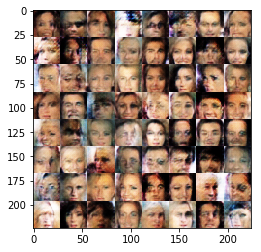

Epoch 1/1... Discriminator Loss: 1.3539... Generator Loss: 0.5785
Epoch 1/1... Discriminator Loss: 1.2034... Generator Loss: 0.8685
Epoch 1/1... Discriminator Loss: 1.1629... Generator Loss: 0.8203
Epoch 1/1... Discriminator Loss: 1.3203... Generator Loss: 0.7740
Epoch 1/1... Discriminator Loss: 1.3532... Generator Loss: 1.1811
Epoch 1/1... Discriminator Loss: 1.3514... Generator Loss: 0.8326
Epoch 1/1... Discriminator Loss: 1.1988... Generator Loss: 0.9088


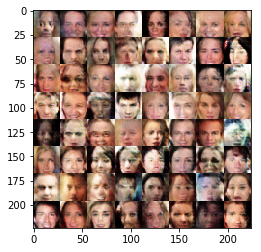

Epoch 1/1... Discriminator Loss: 1.2278... Generator Loss: 0.7872
Epoch 1/1... Discriminator Loss: 1.2100... Generator Loss: 0.7801
Epoch 1/1... Discriminator Loss: 1.2223... Generator Loss: 0.7619
Epoch 1/1... Discriminator Loss: 1.2182... Generator Loss: 0.7250
Epoch 1/1... Discriminator Loss: 1.2679... Generator Loss: 0.8039
Epoch 1/1... Discriminator Loss: 1.2032... Generator Loss: 0.6892


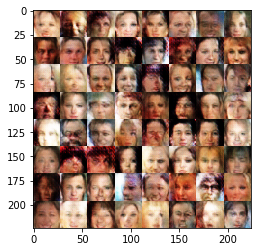

Epoch 1/1... Discriminator Loss: 1.1755... Generator Loss: 0.7716
Epoch 1/1... Discriminator Loss: 1.3418... Generator Loss: 0.5284
Epoch 1/1... Discriminator Loss: 1.2652... Generator Loss: 0.6798
Epoch 1/1... Discriminator Loss: 1.1265... Generator Loss: 0.7959
Epoch 1/1... Discriminator Loss: 1.3205... Generator Loss: 0.7262
Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 1.2513
Epoch 1/1... Discriminator Loss: 1.4065... Generator Loss: 1.3485


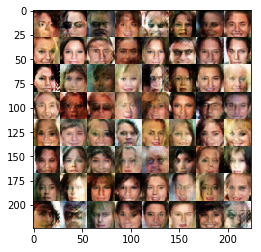

Epoch 1/1... Discriminator Loss: 1.2050... Generator Loss: 0.8986
Epoch 1/1... Discriminator Loss: 1.2402... Generator Loss: 0.6620
Epoch 1/1... Discriminator Loss: 1.2157... Generator Loss: 1.0035
Epoch 1/1... Discriminator Loss: 1.2110... Generator Loss: 0.8253
Epoch 1/1... Discriminator Loss: 1.2714... Generator Loss: 1.1615
Epoch 1/1... Discriminator Loss: 1.2414... Generator Loss: 1.1909


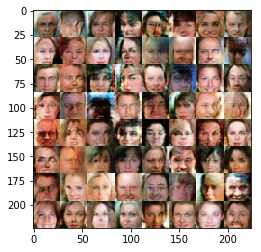

Epoch 1/1... Discriminator Loss: 1.3640... Generator Loss: 0.5456
Epoch 1/1... Discriminator Loss: 1.2476... Generator Loss: 0.8232
Epoch 1/1... Discriminator Loss: 1.1805... Generator Loss: 0.8634
Epoch 1/1... Discriminator Loss: 1.6489... Generator Loss: 0.3387
Epoch 1/1... Discriminator Loss: 1.3362... Generator Loss: 0.7073
Epoch 1/1... Discriminator Loss: 1.3638... Generator Loss: 0.5873


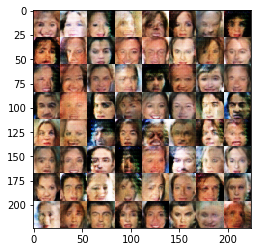

Epoch 1/1... Discriminator Loss: 1.2264... Generator Loss: 0.8397
Epoch 1/1... Discriminator Loss: 1.2340... Generator Loss: 0.8096
Epoch 1/1... Discriminator Loss: 1.1436... Generator Loss: 0.8176
Epoch 1/1... Discriminator Loss: 1.3810... Generator Loss: 0.5222
Epoch 1/1... Discriminator Loss: 1.2369... Generator Loss: 0.5855
Epoch 1/1... Discriminator Loss: 1.4303... Generator Loss: 0.4266
Epoch 1/1... Discriminator Loss: 1.3662... Generator Loss: 0.5232


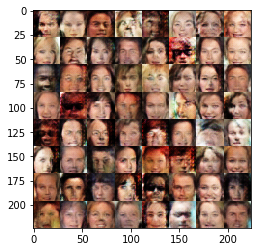

Epoch 1/1... Discriminator Loss: 1.3332... Generator Loss: 0.7546
Epoch 1/1... Discriminator Loss: 1.2703... Generator Loss: 0.5761
Epoch 1/1... Discriminator Loss: 1.2143... Generator Loss: 0.6325
Epoch 1/1... Discriminator Loss: 1.1569... Generator Loss: 0.7609
Epoch 1/1... Discriminator Loss: 1.3130... Generator Loss: 0.6627
Epoch 1/1... Discriminator Loss: 1.2833... Generator Loss: 0.7290


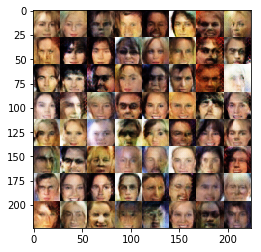

Epoch 1/1... Discriminator Loss: 1.0480... Generator Loss: 1.0101
Epoch 1/1... Discriminator Loss: 1.5329... Generator Loss: 0.4735
Epoch 1/1... Discriminator Loss: 1.2421... Generator Loss: 0.6484


In [14]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.